<a href="https://colab.research.google.com/github/AkshataKishore/IML/blob/master/EDA_and_Feature_Selection_PCOS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/drive")
# After executing the cell above, Drive
# files will be present in "/content/drive/My Drive".
!ls "/content/drive/My Drive"
%cd /content/drive/My Drive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 Advertising.html
'Akshata KM Resume.pdf'
'Akshata Resume.pdf'
'Colab Notebooks'
'Data Science and Big Data Analytics.pdf'
'Document Back up Boeing '
 Epic_Data_Analysis.ipynb
 Epic_Sample.csv
 FeatureHumana.csv
 holdout.csv
 holdoutmodel.csv
 inputmodel.csv
 interpretable_tree.png
 modeldata.csv
'New_data (1).csv'
 New_data.csv
 NYSDOH_HospitalInpatientDischarges_SPARCS_De-Identified_2017.csv
 OutputResultsHumana.csv
 PCOS_Data.csv
 SWEETVIZ_REPORT.html
'UMD Textbooks'
 Untitled0.ipynb
 Untitled1.ipynb
 Untitled2.ipynb
 Untitled3.ipynb
'USA Visa Documents'
/content/drive/My Drive


In [ ]:
import time,os,json
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt


%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('ggplot') # random state
SEED=100
time_start_notebook = time.time()
home = os.path.expanduser('~')
[(x.__name__,x.__version__) for x in [np,pd,sns]]
import pandas as pd 
df = pd.read_csv('PCOS_Data.csv')
from sklearn.model_selection import train_test_split

target = 'PCOS (Y/N)'

df_Xtrain, df_Xtest, ser_ytrain, ser_ytest = train_test_split(
    df.drop(target,axis=1), df[target],
    test_size=0.2, random_state=SEED, stratify=df[target])

ytrain = ser_ytrain.to_numpy().ravel()
ytest = ser_ytest.to_numpy().ravel()

features_train = df_Xtrain.columns.to_list()
features_train

In [3]:
df.head()  #Display top 5 records

,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),Cycle length(days),Marraige Status (Yrs),Pregnant(Y/N),No. of aborptions,FSH(mIU/mL),LH(mIU/mL),Hip(inch),Waist(inch),TSH (mIU/L),AMH(ng/mL),PRL(ng/mL),Vit D3 (ng/mL),PRG(ng/mL),RBS(mg/dl),Weight gain(Y/N),hair growth(Y/N),Skin darkening (Y/N),Hair loss(Y/N),Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
0,0,28,44.6,152.0,19.300000,15,78,22,10.48,2,5,7.0,0,0,7.95,3.68,36,30,0.68,2.07,45.16,17.1,0.57,92.0,0,0,0,0,0,1,0,110,80,3,3,18.0,18.0,8.5
1,0,36,65.0,161.5,24.921163,15,74,20,11.70,2,5,11.0,1,0,6.73,1.09,38,32,3.16,1.53,20.09,61.3,0.97,92.0,0,0,0,0,0,0,0,120,70,3,5,15.0,14.0,3.7
2,1,33,68.8,165.0,25.270891,11,72,18,11.80,2,5,10.0,1,0,5.54,0.88,40,36,2.54,6.63,10.52,49.7,0.36,84.0,0,0,0,1,1,1,0,120,80,13,15,18.0,20.0,10.0
3,0,37,65.0,148.0,29.674945,13,72,20,12.00,2,5,4.0,0,0,8.06,2.36,42,36,16.41,1.22,36.90,33.4,0.36,76.0,0,0,0,0,0,0,0,120,70,2,2,15.0,14.0,7.5
4,0,25,52.0,161.0,20.060954,11,72,18,10.00,2,5,1.0,1,0,3.98,0.90,37,30,3.57,2.26,30.09,43.8,0.38,84.0,0,0,0,1,0,0,0,120,80,3,4,16.0,14.0,7.0


In [4]:
df.describe(include='all') # analytical summary of the dataset

,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),Cycle length(days),Marraige Status (Yrs),Pregnant(Y/N),No. of aborptions,FSH(mIU/mL),LH(mIU/mL),Hip(inch),Waist(inch),TSH (mIU/L),AMH(ng/mL),PRL(ng/mL),Vit D3 (ng/mL),PRG(ng/mL),RBS(mg/dl),Weight gain(Y/N),hair growth(Y/N),Skin darkening (Y/N),Hair loss(Y/N),Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
count,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.00000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000
mean,0.325142,31.406427,59.670132,156.436476,24.338638,13.797732,73.478261,19.241966,11.158563,2.557656,4.941399,7.630813,0.385633,0.283554,5.261121,2.756155,38.013233,33.846881,2.976336,5.622388,24.39741,28.949316,0.618206,99.871834,0.378072,0.274102,0.302457,0.449905,0.485822,0.514178,0.241966,114.801512,77.088847,6.105860,6.659735,15.018526,15.452495,8.494272
std,0.468871,5.443515,11.100514,6.021679,4.082604,1.847068,2.705914,1.697273,0.864174,0.900853,1.500747,4.806145,0.487205,0.684607,4.462897,2.317071,4.000215,3.627180,3.751471,5.927907,15.04944,12.565367,3.851575,18.719245,0.485365,0.446483,0.459757,0.497955,0.500272,0.500272,0.428679,5.935920,4.710728,4.222072,4.446388,3.585022,3.338548,2.167970
min,0.000000,20.000000,31.000000,137.000000,12.417882,11.000000,70.000000,16.000000,8.500000,2.000000,0.000000,0.000000,0.000000,0.000000,0.210000,0.020000,26.000000,24.000000,0.040000,0.100000,0.40000,6.077000,0.047000,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,27.000000,52.000000,152.000000,21.833562,13.000000,72.000000,18.000000,10.500000,2.000000,5.000000,4.000000,0.000000,0.000000,3.340000,1.030000,36.000000,32.000000,1.470000,2.010000,14.52000,20.700000,0.250000,92.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,110.000000,70.000000,3.000000,3.000000,13.000000,13.000000,7.000000
50%,0.000000,31.000000,59.000000,156.000000,24.300000,14.000000,72.000000,18.000000,11.000000,2.000000,5.000000,7.000000,0.000000,0.000000,4.860000,2.260000,38.000000,34.000000,2.260000,3.700000,21.92000,25.900000,0.320000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,110.000000,80.000000,5.000000,6.000000,15.000000,16.000000,8.500000
75%,1.000000,35.000000,65.000000,160.000000,26.700000,15.000000,74.000000,20.000000,11.700000,4.000000,5.000000,10.000000,1.000000,0.000000,6.400000,3.670000,40.000000,36.000000,3.570000,6.900000,29.97000,34.400000,0.460000,107.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,120.000000,80.000000,9.000000,10.000000,18.000000,18.000000,9.800000
max,1.000000,48.000000,108.000000,180.000000,38.900000,18.000000,82.000000,28.000000,14.800000,5.000000,12.000000,30.000000,1.000000,5.000000,65.400000,14.690000,48.000000,47.000000,65.000000,66.000000,128.24000,90.000000,85.000000,350.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,140.000000,100.000000,22.000000,20.000000,24.000000,24.000000,18.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 529 entries, 0 to 528
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PCOS (Y/N)             529 non-null    int64  
 1    Age (yrs)             529 non-null    int64  
 2   Weight (Kg)            529 non-null    float64
 3   Height(Cm)             529 non-null    float64
 4   BMI                    529 non-null    float64
 5   Blood Group            529 non-null    int64  
 6   Pulse rate(bpm)        529 non-null    int64  
 7   RR (breaths/min)       529 non-null    int64  
 8   Hb(g/dl)               529 non-null    float64
 9   Cycle(R/I)             529 non-null    int64  
 10  Cycle length(days)     529 non-null    int64  
 11  Marraige Status (Yrs)  529 non-null    float64
 12  Pregnant(Y/N)          529 non-null    int64  
 13  No. of aborptions      529 non-null    int64  
 14  FSH(mIU/mL)            529 non-null    float64
 15  LH(mIU

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5a775024e0>,
      dtype=object)

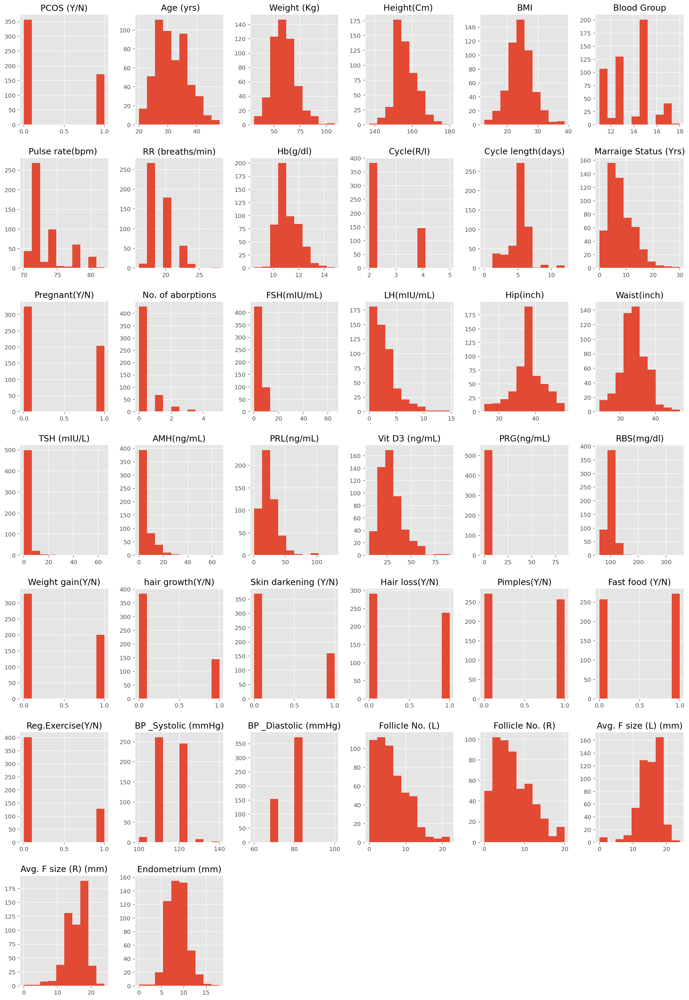

In [5]:
df.hist(figsize=(20,30)) 

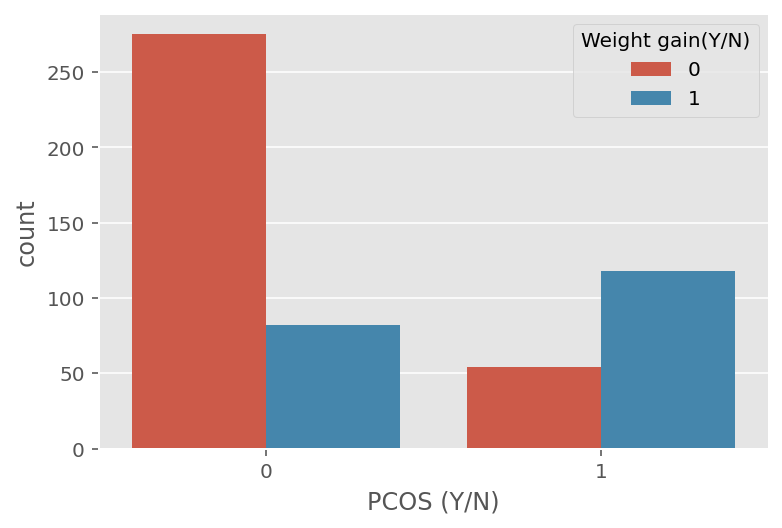

In [6]:
#Relationship between two categorical variables
sns.countplot(x="PCOS (Y/N)", hue = "Weight gain(Y/N)", data = df)

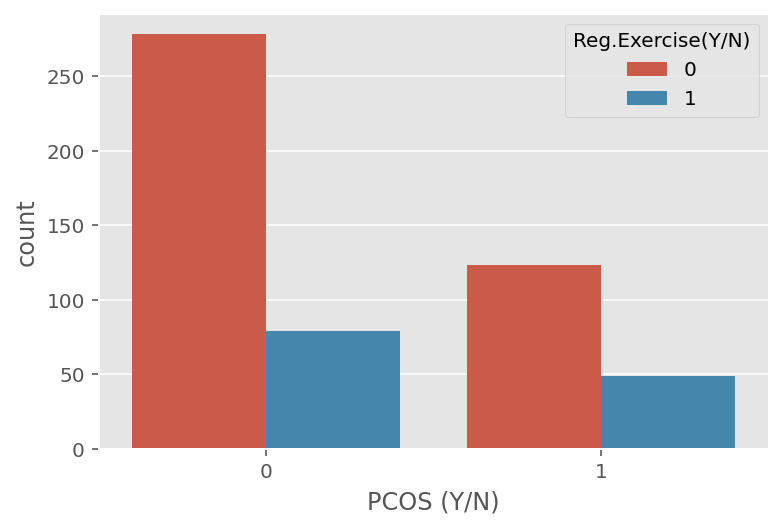

In [ ]:
#Relationship between two categorical variables
sns.countplot(x="PCOS (Y/N)", hue = "Reg.Exercise(Y/N)", data = df)

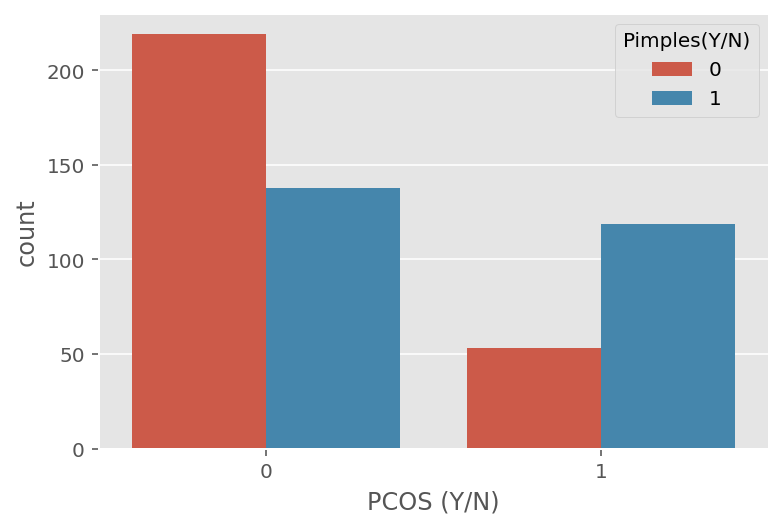

In [ ]:
#Relationship between two categorical variables
sns.countplot(x="PCOS (Y/N)", hue = "Pimples(Y/N)", data = df)

In [ ]:
sns.pairplot(df)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


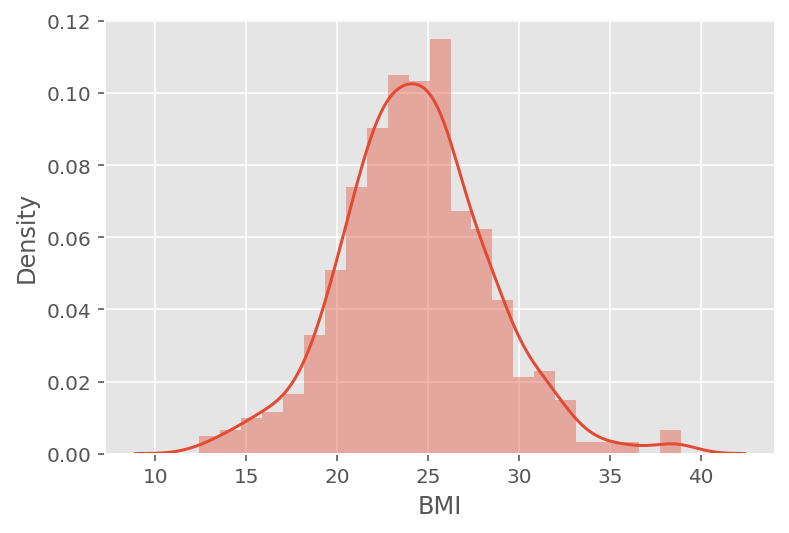

In [5]:
sns.distplot(df['BMI'])

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


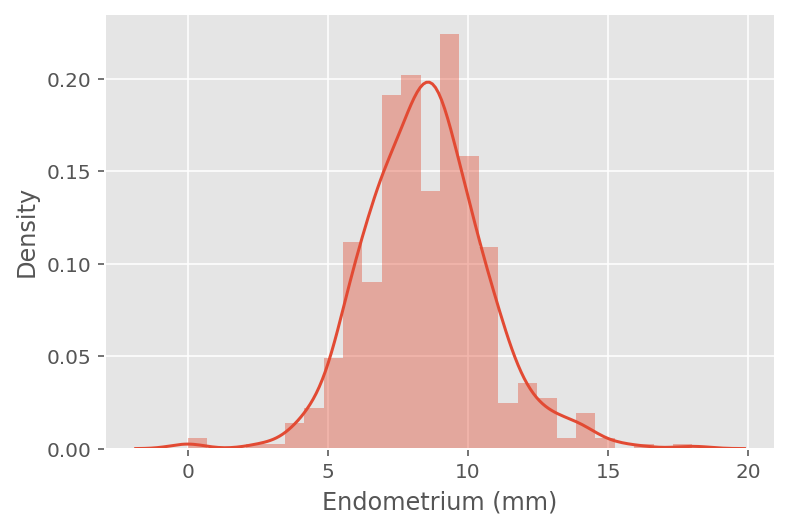

In [6]:
sns.distplot(df['Endometrium (mm)'])

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f9c89592400>,
      dtype=object)

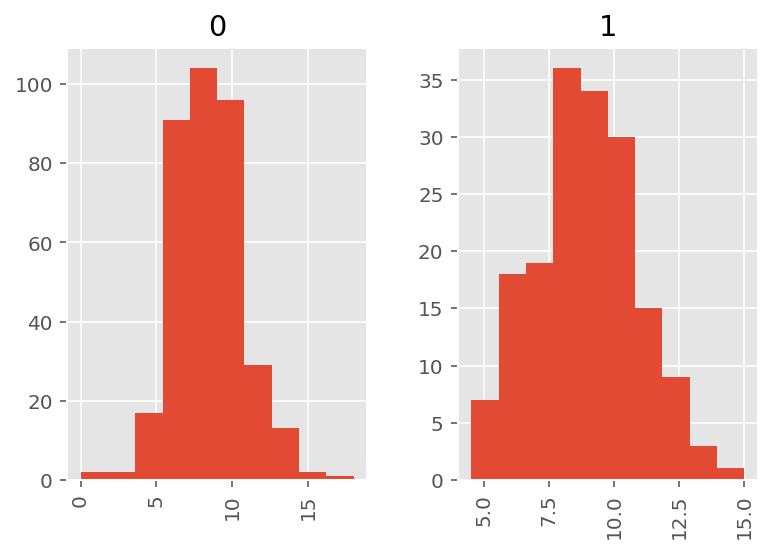

In [7]:
df.hist(by='PCOS (Y/N)', column = 'Endometrium (mm)')

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f9c88f3ee80>,
      dtype=object)

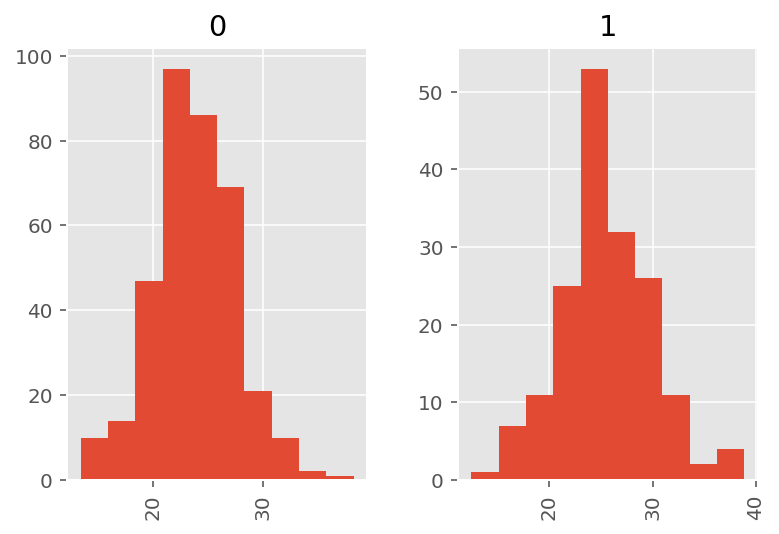

In [8]:
df.hist(by='PCOS (Y/N)', column = 'BMI')

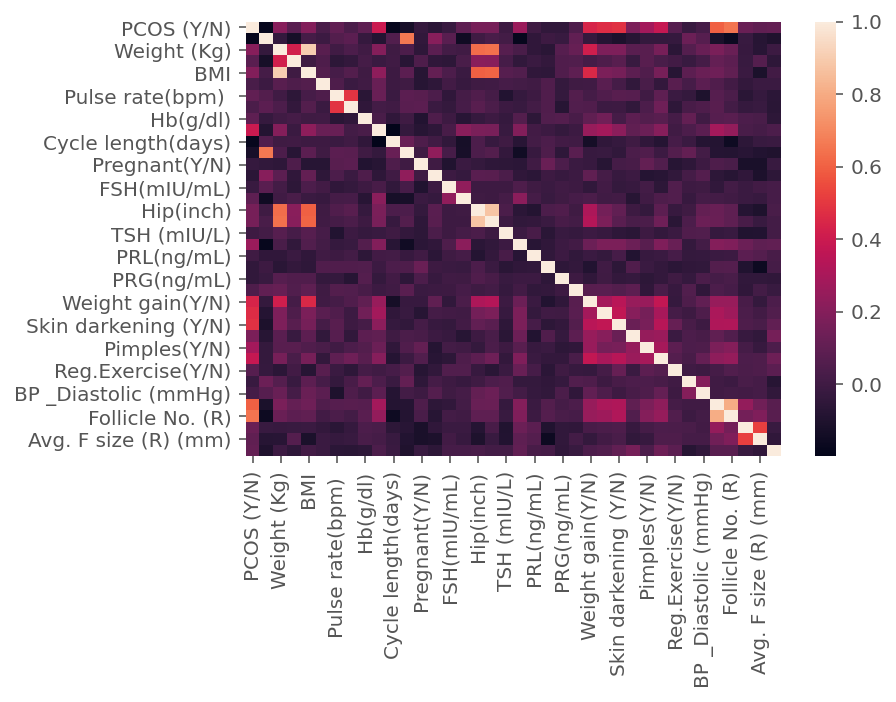

In [10]:
corr= df.corr()
sns.heatmap(corr)

In [11]:
sns.pairplot(df)

In [13]:

import pandas as pd
import numpy as np
# import seaborn as sns
# import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

# plt.style.use('seaborn-colorblind')
# %matplotlib inline
# from feature_selection import filter_method as ft

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [14]:
# step forward feature selection
# select top 10 features based on the optimal roc_auc and RandomForest Classifier

sfs1 = SFS(RandomForestClassifier(n_jobs=-1,n_estimators=5), 
           k_features=10, 
           forward=True, 
           floating=False, 
           verbose=1,
           scoring='roc_auc',
           cv=3)

sfs1 = sfs1.fit(np.array(df_Xtrain), ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:   14.9s finished
Features: 1/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:   13.3s finished
Features: 2/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:   13.0s finished
Features: 3/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:   12.6s finished
Features: 4/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:   12.2s finished
Features: 5/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:   11.9s finished
Features: 6/10[Parallel(

In [15]:
# step backward feature selection
# select top 10 features based on the optimal roc_auc and RandomForest Classifier

sfs2 = SFS(RandomForestClassifier(n_jobs=-1,n_estimators=5), 
           k_features=10, 
           forward=False, 
           floating=False, 
           verbose=1,
           scoring='roc_auc',
           cv=3)

sfs2 = sfs1.fit(np.array(df_Xtrain.fillna(0)), ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:   13.7s finished
Features: 1/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:   13.3s finished
Features: 2/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:   12.9s finished
Features: 3/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:   12.6s finished
Features: 4/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:   12.2s finished
Features: 5/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:   11.8s finished
Features: 6/10[Parallel(

In [16]:
# step backward feature selection
# select top 10 features based on the optimal roc_auc and RandomForest Classifier

sfs2 = SFS(RandomForestClassifier(n_jobs=-1,n_estimators=5), 
           k_features=10, 
           forward=False, 
           floating=False, 
           verbose=1,
           scoring='roc_auc',
           cv=3)

sfs2 = sfs1.fit(np.array(df_Xtrain.fillna(0)), ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:   13.7s finished
Features: 1/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:   13.4s finished
Features: 2/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:   13.0s finished
Features: 3/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:   12.6s finished
Features: 4/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:   12.2s finished
Features: 5/10[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:   11.9s finished
Features: 6/10[Parallel(

In [17]:
selected_feat2= df_Xtrain.columns[list(sfs2.k_feature_idx_)]
selected_feat2

Index(['Cycle(R/I)', 'PRL(ng/mL)', 'hair growth(Y/N)', 'Skin darkening (Y/N)',
       'Hair loss(Y/N)', 'Fast food (Y/N)', 'BP _Systolic (mmHg)',
       'BP _Diastolic (mmHg)', 'Follicle No. (R)', 'Avg. F size (R) (mm)'],
      dtype='object')

In [18]:
efs1 = EFS(RandomForestClassifier(n_jobs=-1,n_estimators=5, random_state=0), 
           min_features=1,
           max_features=6, 
           scoring='roc_auc',
           print_progress=True,
           cv=2)

# in order to shorter search time for the demonstration
# we only try all possible 1,2,3,4,5,6
# feature combinations from a dataset of 10 features

efs1 = efs1.fit(np.array(df_Xtrain[df_Xtrain.columns[0:10]].fillna(0)), ytrain)

Features: 847/847

In [ ]:
selected_feat3= df_Xtrain.columns[list(efs1.best_idx_)]
selected_feat3

In [ ]:
! pip install feature_selector

6 features with a correlation magnitude greater than 0.50.



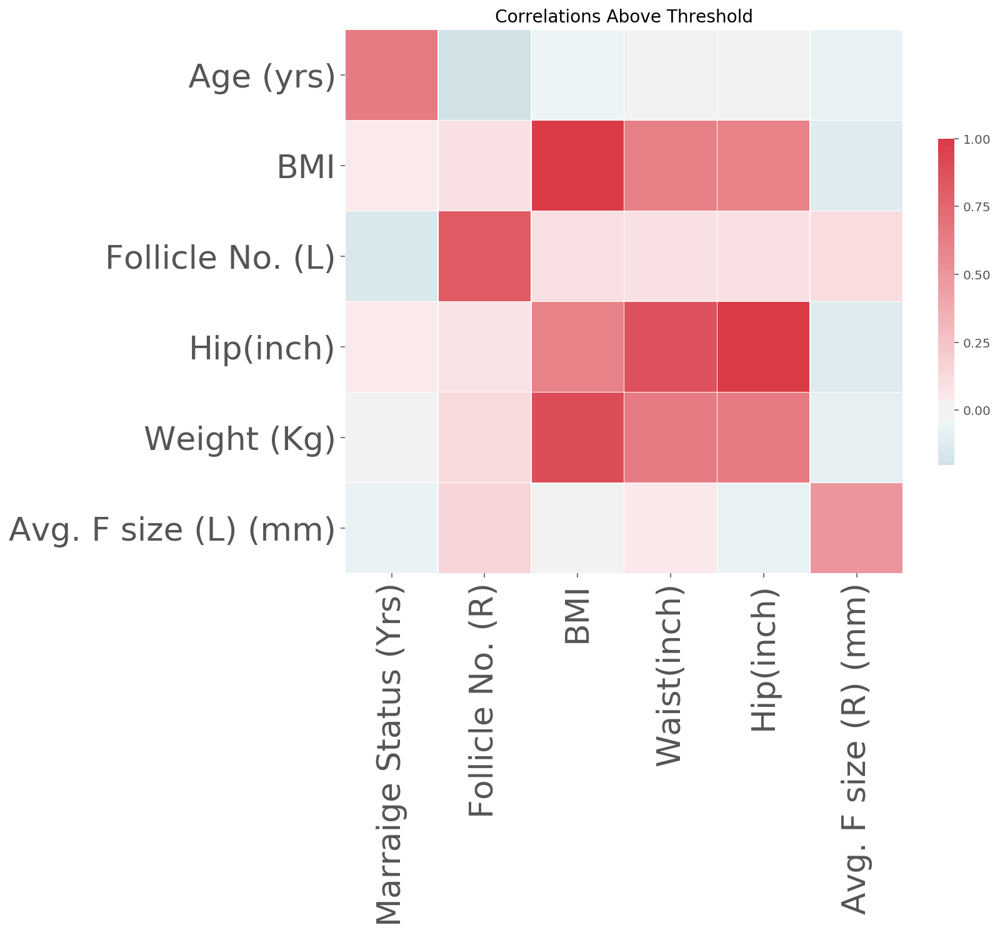

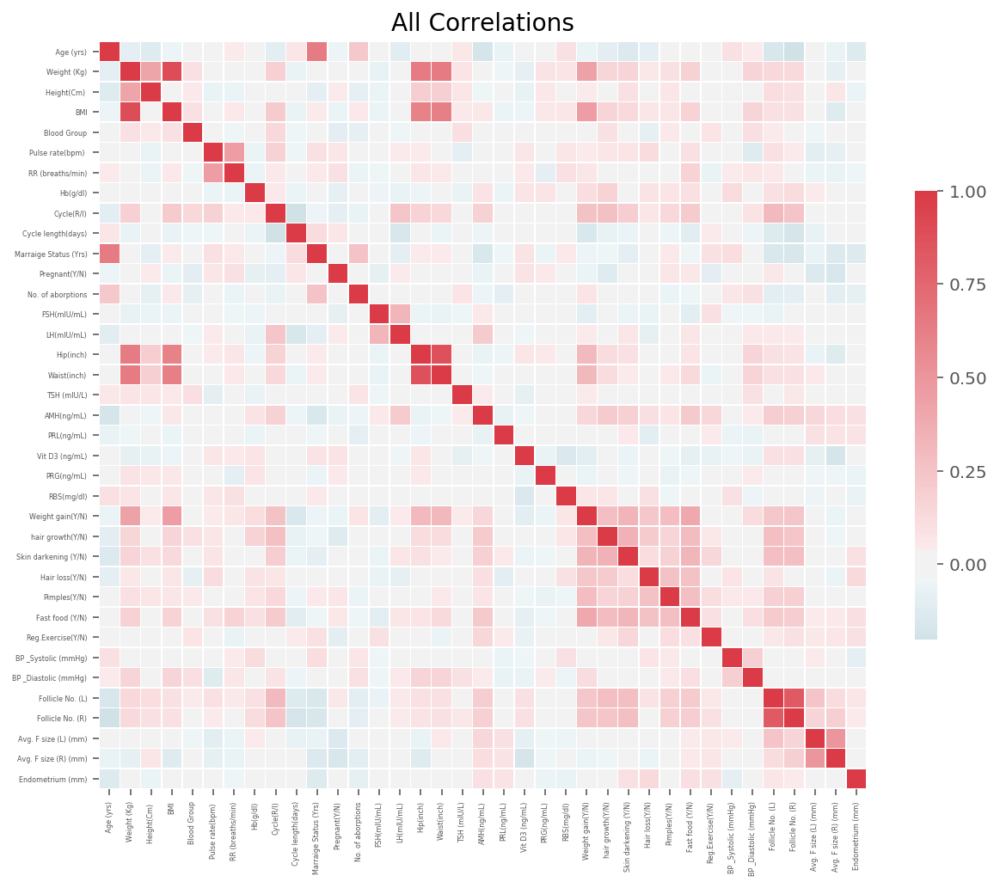

In [17]:

from feature_selector import FeatureSelector
fs = FeatureSelector(data = df_Xtrain, labels = ser_ytrain)
fs.identify_collinear(correlation_threshold=0.50)
correlated_features = fs.ops['collinear']
correlated_features[:11]
fs.plot_collinear()
fs.plot_collinear(plot_all=True)

In [18]:
fs.record_collinear.head()

,drop_feature,corr_feature,corr_value
0,BMI,Weight (Kg),0.896644
1,Marraige Status (Yrs),Age (yrs),0.641890
2,Hip(inch),Weight (Kg),0.639542
3,Hip(inch),BMI,0.605962
4,Waist(inch),Weight (Kg),0.646542


In [19]:
fs.identify_zero_importance(task = 'classification', eval_metric = 'auc', 
                            n_iterations = 10, early_stopping = True)

Training Gradient Boosting Model

Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[17]	valid_0's auc: 0.921875
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[44]	valid_0's auc: 0.967347
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[24]	valid_0's auc: 0.954872
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[6]	valid_0's auc: 0.950166
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[41]	valid_0's auc: 0.928125
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[41]	valid_0's auc: 0.920468
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[10]	valid_0's auc: 0.979469
Training until validation scores don't improve for 100 rounds.
Early stopping,

In [20]:
one_hot_features = fs.one_hot_features
base_features = fs.base_features
print('There are %d original features' % len(base_features))
print('There are %d one-hot features' % len(one_hot_features))

There are 37 original features
There are 0 one-hot features


In [21]:
fs.data_all.head(10)

,Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),Cycle length(days),Marraige Status (Yrs),Pregnant(Y/N),No. of aborptions,FSH(mIU/mL),LH(mIU/mL),Hip(inch),Waist(inch),TSH (mIU/L),AMH(ng/mL),PRL(ng/mL),Vit D3 (ng/mL),PRG(ng/mL),RBS(mg/dl),Weight gain(Y/N),hair growth(Y/N),Skin darkening (Y/N),Hair loss(Y/N),Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
124,26,78.0,159.0,30.853210,13,78,20,11.0,2,5,4.0,0,0,4.88,5.84,45,39,2.31,9.20,31.53,56.2,0.40,100.0,1,0,1,1,1,1,1,120,80,8,10,16.0,18.0,8.50
40,32,40.0,156.0,16.436555,15,78,22,10.5,2,5,6.0,0,0,7.87,4.89,34,30,5.00,2.35,31.32,56.2,0.25,107.0,0,0,0,0,0,0,0,110,80,5,8,14.0,14.0,7.30
282,27,65.0,162.0,24.767566,15,72,18,10.7,2,5,3.5,0,1,5.47,4.95,38,36,4.29,5.40,41.03,21.4,0.25,92.0,1,1,1,1,1,0,0,110,80,5,3,16.0,17.0,8.00
443,35,57.0,154.0,24.000000,15,72,18,10.7,2,5,7.0,0,0,4.41,1.97,38,32,5.00,0.87,12.71,16.0,0.27,92.0,0,0,0,0,0,0,1,110,70,11,15,19.0,21.0,7.85
112,39,71.2,170.0,24.636678,15,72,20,10.1,2,5,12.0,0,0,4.61,3.37,41,36,4.33,3.30,13.92,29.0,0.66,100.0,1,0,0,1,0,0,0,120,80,5,3,19.0,20.0,7.00
385,29,74.0,159.0,29.300000,11,72,20,10.8,4,3,3.0,1,0,5.76,6.42,42,38,0.95,6.00,45.54,36.2,0.32,92.0,1,0,1,1,1,1,0,120,80,10,9,15.0,14.0,8.00
505,27,59.0,152.0,25.200000,11,72,18,11.5,2,5,2.0,0,0,5.95,3.90,36,34,2.21,5.40,35.19,24.2,0.50,92.0,0,0,0,0,0,0,0,110,70,5,8,20.0,21.0,9.80
380,28,61.0,152.0,26.400000,15,74,20,10.5,4,2,3.0,0,0,3.30,0.59,38,35,2.78,9.10,7.81,10.1,0.27,92.0,1,0,0,1,1,1,0,120,80,10,9,19.0,15.0,10.00
471,33,87.9,158.0,35.200000,15,72,20,10.0,4,2,8.0,0,0,2.81,0.37,46,44,6.55,5.75,28.05,21.0,0.21,116.0,1,0,0,0,1,1,0,120,80,7,12,20.0,14.0,8.00
423,33,57.0,163.0,21.500000,15,72,18,11.5,2,6,10.0,0,0,4.09,2.63,32,28,1.08,10.30,10.62,27.2,0.25,100.0,0,0,0,1,1,1,1,110,70,5,7,13.0,11.0,10.00


In [22]:
zero_importance_features = fs.ops['zero_importance']
zero_importance_features[10:15]

[]

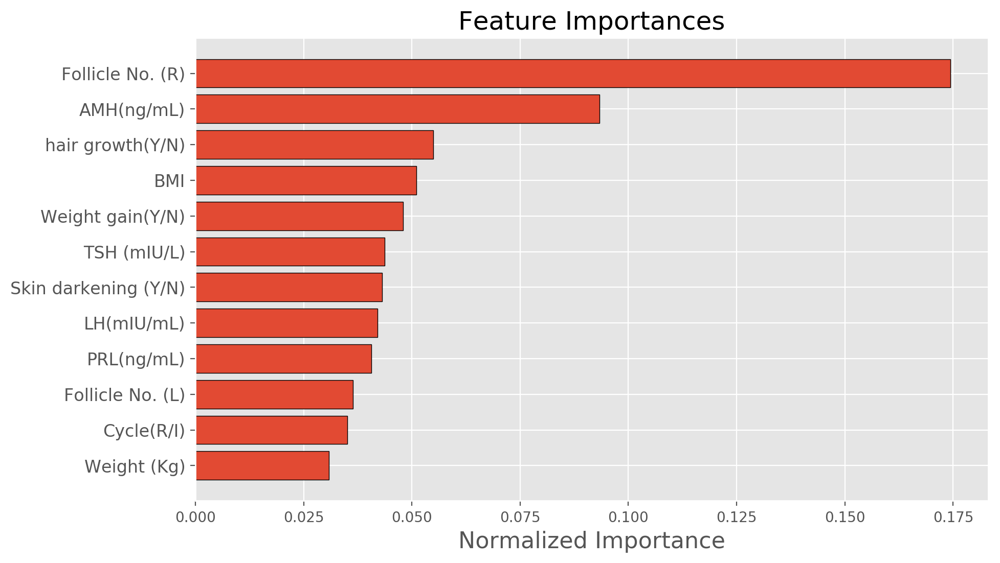

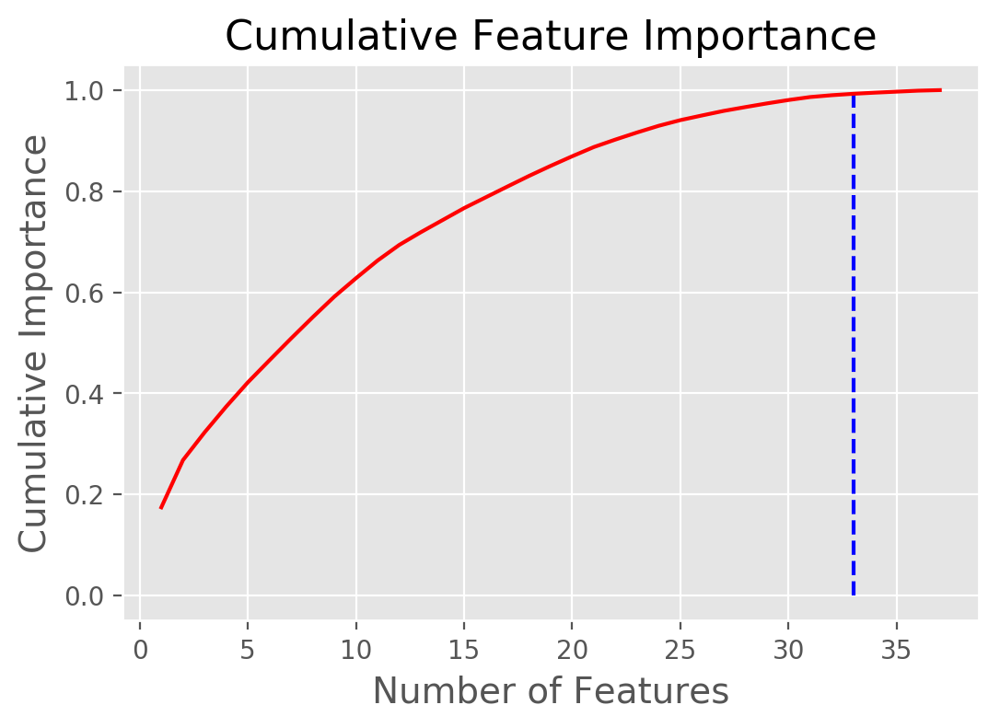

33 features required for 0.99 of cumulative importance


In [23]:

fs.plot_feature_importances(threshold = 0.99, plot_n = 12)

In [24]:
fs.feature_importances.head(10)

,feature,importance,normalized_importance,cumulative_importance
0,Follicle No. (R),62.2,0.174376,0.174376
1,AMH(ng/mL),33.3,0.093356,0.267732
2,hair growth(Y/N),19.6,0.054948,0.322680
3,BMI,18.2,0.051023,0.373703
4,Weight gain(Y/N),17.1,0.047939,0.421643
5,TSH (mIU/L),15.6,0.043734,0.465377
6,Skin darkening (Y/N),15.4,0.043174,0.508551
7,LH(mIU/mL),15.0,0.042052,0.550603
8,PRL(ng/mL),14.5,0.040650,0.591253
9,Follicle No. (L),13.0,0.036445,0.627698


In [25]:
fs.identify_low_importance(cumulative_importance = 0.99)

32 features required for cumulative importance of 0.99 after one hot encoding.
5 features do not contribute to cumulative importance of 0.99.



In [26]:
low_importance_features = fs.ops['low_importance']
low_importance_features[:5]

['No. of aborptions',
 'BP _Systolic (mmHg)',
 'RR (breaths/min)',
 'Reg.Exercise(Y/N)',
 'BP _Diastolic (mmHg)']